# Setup

In [2]:
import zipfile
import os
import sys
from glob import glob

import cv2
import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import PIL.Image as pil

import torch
from torchvision import transforms

# MONODEPTH
!git clone https://github.com/nianticlabs/monodepth2.git
# sys.path.append("/kaggle/working/monodepth2")

# Uncomment this line if you are running this notebook on your local machine.
sys.path.append("monodepth2/") 

from monodepth2.layers import ConvBlock
from monodepth2.layers import Conv3x3, disp_to_depth
from monodepth2.utils import download_model_if_doesnt_exist
from monodepth2.networks.depth_decoder import DepthDecoder
from monodepth2.networks.resnet_encoder import ResnetEncoder

!git clone https://github.com/ultralytics/yolov5
!pip install -r yolov5/requirements.txt 

%matplotlib inline

Cloning into 'monodepth2'...
remote: Enumerating objects: 180, done.
remote: Total 180 (delta 0), reused 0 (delta 0), pack-reused 180 (from 1)
Receiving objects: 100% (180/180), 10.27 MiB | 34.70 MiB/s, done.
Resolving deltas: 100% (89/89), done.
Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.10 MiB | 27.89 MiB/s, done.
Resolving deltas: 100% (11855/11855), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 29.2 MB/s eta 0:00:00


In [3]:
# Download the dataset. 
!curl -O https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_drive_0106/2011_09_26_drive_0106_sync.zip   
!curl -O https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_drive_0106/2011_09_26_drive_0106_extract.zip    
!curl -O https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_calib.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  893M  100  893M    0     0  34.2M      0  0:00:26  0:00:26 --:--:-- 51.7M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1317M  100 1317M    0     0  29.2M      0  0:00:44  0:00:44 --:--:-- 25.9M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4068  100  4068    0     0  27089      0 --:--:-- --:--:-- --:--:-- 27120


In [4]:
with zipfile.ZipFile('/kaggle/working/2011_09_26_drive_0106_sync.zip', 'r') as zip_ref:
    zip_ref.extractall('/kaggle/working/data')

with zipfile.ZipFile('/kaggle/working/2011_09_26_drive_0106_extract.zip', 'r') as zip_ref:
    zip_ref.extractall('/kaggle/working/data')

with zipfile.ZipFile('/kaggle/working/2011_09_26_calib.zip', 'r') as zip_ref:
    zip_ref.extractall('/kaggle/working/calib')

In [5]:
data_path = '/kaggle/working/data/2011_09_26/2011_09_26_drive_0106_sync/'
data_path_unrect = '/kaggle/working/data/2011_09_26/2011_09_26_drive_0106_extract/'
calib_path = '/kaggle/working/calib/2011_09_26'

left_image_unrect_paths = sorted(glob(os.path.join(data_path_unrect, 'image_02/data/*.png')))
right_image_unrect_paths = sorted(glob(os.path.join(data_path_unrect, 'image_03/data/*.png')))

left_image_paths = sorted(glob(os.path.join(data_path, 'image_02/data/*.png')))
right_image_paths = sorted(glob(os.path.join(data_path, 'image_03/data/*.png')))

bin_paths = sorted(glob(os.path.join(data_path, 'velodyne_points/data/*.bin')))

with open(os.path.join(calib_path, 'calib_cam_to_cam.txt'),'r') as f:
    cam_calib = f.readlines()
    
with open(os.path.join(calib_path, 'calib_velo_to_cam.txt'),'r') as f:
     velo_calib = f.readlines()

In [6]:
# 3x4 projection matrix after rectification
P_left = np.array([float(x) for x in cam_calib[25].strip().split(' ')[1:]]).reshape((3,4))
P_right = np.array([float(x) for x in cam_calib[33].strip().split(' ')[1:]]).reshape((3,4))

# 3x3 rectifying rotation to make image planes co-planar
R_left_rect = np.array([float(x) for x in cam_calib[24].strip().split(' ')[1:]]).reshape((3, 3,))
R_right_rect = np.array([float(x) for x in cam_calib[32].strip().split(' ')[1:]]).reshape((3, 3,))

# 3x3 calibration matrix of camera xx before rectification
K_left = np.array([float(x) for x in cam_calib[19].strip().split(' ')[1:]]).reshape((3, 3,))
K_right = np.array([float(x) for x in cam_calib[27].strip().split(' ')[1:]]).reshape((3, 3,))

# 1x5 distortion vector of camera xx before rectification
D_left = np.array([float(x) for x in cam_calib[20].strip().split(' ')[1:]]).reshape((1, 5,))
D_right = np.array([float(x) for x in cam_calib[28].strip().split(' ')[1:]]).reshape((1, 5,))

# 1x2 size of image xx before rectification
S_left = np.array([float(x) for x in cam_calib[18].strip().split(' ')[1:]]).reshape((1, 2,))
S_right = np.array([float(x) for x in cam_calib[26].strip().split(' ')[1:]]).reshape((1, 2,))

# 3x3 rotation matrix of camera xx (extrinsic)
R_left = np.array([float(x) for x in cam_calib[21].strip().split(' ')[1:]]).reshape((3, 3,))
R_right = np.array([float(x) for x in cam_calib[29].strip().split(' ')[1:]]).reshape((3, 3,))

# 3x3 rotation matrix and 3x1 translation vector
R_cam_velo = np.array([float(x) for x in velo_calib[1].strip().split(' ')[1:]]).reshape((3, 3))
t_cam_velo = np.array([float(x) for x in velo_calib[2].strip().split(' ')[1:]])[:, None]
T_cam_velo = np.vstack((np.hstack((R_cam_velo, t_cam_velo)),np.array([0, 0, 0, 1])))

# Part 1: Stereo Rectification & Disparity

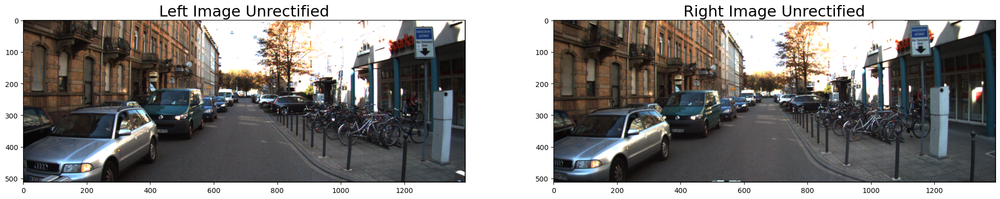

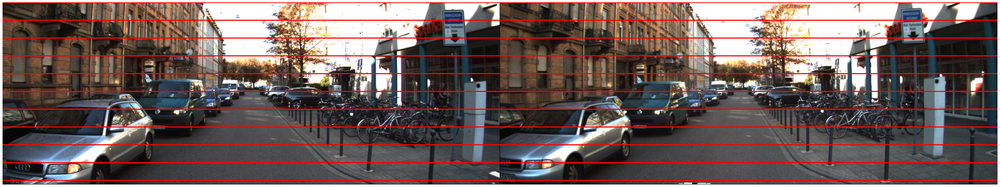

In [7]:
img_index = 80

left_image_unrect = cv2.cvtColor(cv2.imread(left_image_unrect_paths[img_index]), cv2.COLOR_BGR2RGB)
right_image_unrect = cv2.cvtColor(cv2.imread(right_image_unrect_paths[img_index]), cv2.COLOR_BGR2RGB)

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 15))
ax1.imshow(left_image_unrect)
ax1.set_title('Left Image Unrectified', size=22)
ax2.imshow(right_image_unrect)
ax2.set_title('Right Image Unrectified', size=22)

combined = np.hstack((left_image_unrect, right_image_unrect))
for i in range(0, combined.shape[0], 50):  
    cv2.line(combined, (0, i), (combined.shape[1], i), (255, 0, 0), 2)

plt.figure(figsize=(50, 50))
plt.imshow(combined)
plt.axis("off")
plt.show()

# Part 1a: Comment on the epipolar lines.
<span style="color:red">1. Are these images perfectly rectified? Provide reasoning.</span>

<span style="color:blue">Answer: </span>
- These images are not fully rectified due to the epipolar lines not aligning when comparing the same features in the seperate images.
- When using the road sign in the top right corner of the scene that these two images are not rectified.
- In the images below we use the road sign as a feature check for the epipoloar lines being fully aligned.
- The epipolar lines go through different parts of the sign meaning the images aren't rectified.
- This means if we carry out a disparity map on the two images the depth estimation from this map will be inaccurate so rectification needs to take place. 

<div style="display: flex; justify-content: space-between;">
    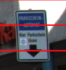
    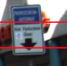
</div>


<span style="color:red">2. If the images are not co-planar, how does it impact the stereo depth estimation?</span>.

<span style="color:blue">Answer: </span>

- If the images are not co-planar, the epipolar lines will not be aligned in the horizontal direction. This misallignement complicates the correspondencemachine problmisalignmentatchine the features between the two images will be distorted.
- Correspondance algorithms will still be able to find the areas in the two images that line up correctly. However in order to carry out the triangilation the images need to be aligned in the vertical direction.
- As a result the disparity map will contain errors, leading to inaccurate depth estimation. For example, objects may appear closer or farther than they actually are and when the 3D reconstruction is calculated it will be distorted due to this.
- To address this the image is rectified so that corresponding points lie on the same horizontal scanline, simplifying the correspondance problem and improving the accuracy of depth estimation.

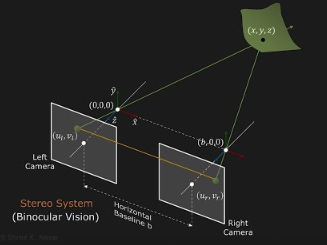


# Part 1b: Perform stereo rectification on 'left_image_unrect' and 'right_image_unrect'.
* Use the cv2.initUndistortRectifyMap and cv2.remap functions

In [8]:
h, w = left_image_unrect.shape[:2]
image_size = (w, h)
# left image
mapx1, mapy1 = cv2.initUndistortRectifyMap(K_left, D_left, R_left_rect, P_left[:, :3], (1392, 512), cv2.CV_32FC1)
rectified_left = cv2.remap(left_image_unrect, mapx1, mapy1, cv2.INTER_LINEAR)

# right image
mapx2, mapy2 = cv2.initUndistortRectifyMap(K_right, D_right, R_right_rect, P_right[:, :3],  (1392, 512), cv2.CV_32FC1)
rectified_right = cv2.remap(right_image_unrect, mapx2, mapy2, cv2.INTER_LINEAR)

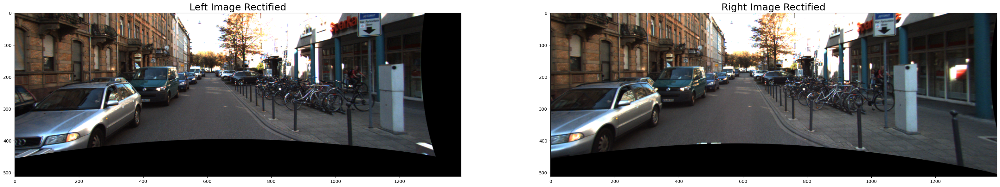

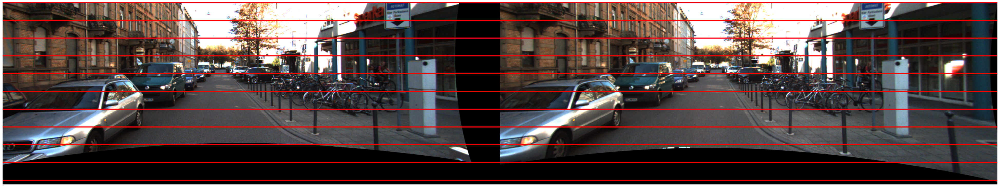

In [9]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 40))
ax1.imshow(rectified_left)
ax1.set_title('Left Image Rectified', size=22)
ax2.imshow(rectified_right)
ax2.set_title('Right Image Rectified', size=22)

combined = np.hstack((rectified_left, rectified_right))
for i in range(0, combined.shape[0], 50):  # Draw horizontal lines along every 50 pixels
    cv2.line(combined, (0, i), (combined.shape[1], i), (255, 0, 0), 2)

plt.figure(figsize=(50, 50))
plt.imshow(combined)
plt.axis("off")
plt.show()

# Part 1c) Comment on the epipolar lines after rectification. 
# How do they compare to those in the unrectified images
<span style="color:blue">Answer: </span>

- Once the images are rectified we can see that the epipolar lines are aligned horizontally.
- The road signs lie on the same horizontal scanline in both of these images as shwon by the red guidelines passing through the smae parts of the road sign. 

<div style="display: flex; justify-content: space-between;">
    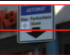
    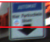
</div>

__Distortion and Black Areas__
- Rectification involves image warping in order to align the epipolar lines horizontally. This warping can introduce dostortion and black areas in the rectified images.
- The black areas occur beacuse of the warping process stretches and compresses parts of the image leaving some regions with no pixel data.


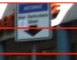

# Part 2: Disparity Map Generation

# Part 2a: Compute the disparity between the two images using a semi global block matching algorithm. 
For ease of use, you may continue the assignment using the pre-rectified images from the dataset, i.e., images in 'left_image_paths' and 'right_image_paths'.

https://en.wikipedia.org/wiki/Semi-global_matching

https://docs.opencv.org/3.4/d2/d85/classcv_1_1StereoSGBM.html


In [10]:
# Complete the function below
def compute_sgbm_disparity(left_image, right_image, num_disparities, 
                           block_size, window_size):

    sgbm = cv2.StereoSGBM_create(  
             	#minDisparity = 0,
             	numDisparities = num_disparities,
             	blockSize = block_size,
             	P1 = 8*3*window_size**2,
             	P2 = 32*3*window_size**2,
             	#disp12MaxDiff = 1,
               	#uniquenessRatio = 0,
             	#speckleWindowSize = 100,
               	#speckleRange = 32,
            	#mode = cv2.STEREO_SGBM_MODE_SGBM
)

    disparity = sgbm.compute(left_image, right_image).astype(np.float32)/16.0
    # P1 and P2 control disparity smoothness. Experiment with these values to generate a 'smooth' disparity map.


    return disparity

# Part 2b: Use the function ('compute_sgbm_disparity') and vary the 3 input parameters (num_disparities, block_size, window_size).

* experiment with the 3 input parameters  

[[         -1          -1          -1 ...          48          48          48]
 [         -1          -1          -1 ...          48          48          48]
 [         -1          -1          -1 ...      48.125      48.125      48.125]
 ...
 [         -1          -1          -1 ...      75.125      75.125      75.125]
 [         -1          -1          -1 ...      75.062      75.062      75.062]
 [         -1          -1          -1 ...      75.062      75.062          75]]


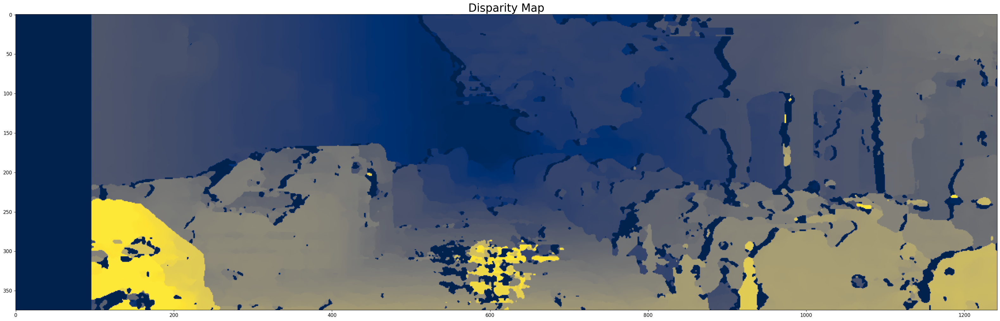

In [43]:
left_image = cv2.cvtColor(cv2.imread(left_image_paths[img_index]), cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(cv2.imread(right_image_paths[img_index]), cv2.COLOR_BGR2RGB)

left_image_gray = cv2.cvtColor(left_image, cv2.COLOR_RGB2GRAY)
right_image_gray = cv2.cvtColor(right_image, cv2.COLOR_RGB2GRAY)

# Use the below values as initial guesses. Try multiple other combinations.
num_disparities =  96 #(6x16)
block_size =11
window_size = 9
disparity_stereo = compute_sgbm_disparity(left_image_gray, right_image_gray, num_disparities, block_size, window_size)
print(disparity_stereo)
plt.figure(figsize = (40,40))
plt.imshow(disparity_stereo, cmap='cividis')
plt.title('Disparity Map', size=25)
plt.show()

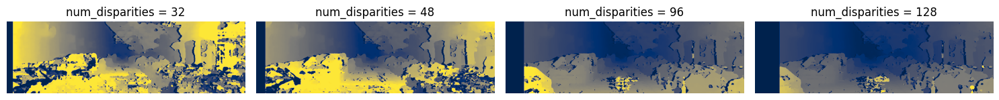

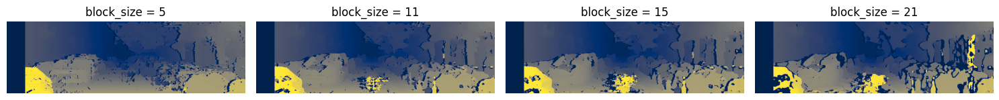

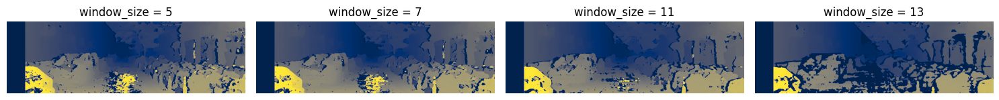

In [41]:
import matplotlib.pyplot as plt

num_disparities_values = [32, 48, 96, 128]
block_size_values = [5, 11, 15, 21]
window_size_values = [5, 7, 11, 13]

def plot_disparity_maps(left_image_gray, right_image_gray, param_values, param_name):
    plt.figure(figsize=(15, 5))
    for i, value in enumerate(param_values):
        if param_name == 'num_disparities':
            disparity_stereo = compute_sgbm_disparity(left_image_gray, right_image_gray, value, block_size=11, window_size=9)
        elif param_name == 'block_size':
            disparity_stereo = compute_sgbm_disparity(left_image_gray, right_image_gray, num_disparities=96, block_size=value, window_size=9)
        elif param_name == 'window_size':
            disparity_stereo = compute_sgbm_disparity(left_image_gray, right_image_gray, num_disparities=96, block_size=11, window_size=value)
        
        plt.subplot(1, 4, i+1)
        plt.imshow(disparity_stereo, cmap='cividis')
        plt.title(f'{param_name} = {value}', size=12)
        plt.axis('off')
        plt.tight_layout()
    plt.show()

#Plot disparity maps for each parameter
plot_disparity_maps(left_image_gray, right_image_gray, num_disparities_values, 'num_disparities')
plot_disparity_maps(left_image_gray, right_image_gray, block_size_values, 'block_size')
plot_disparity_maps(left_image_gray, right_image_gray, window_size_values, 'window_size')

<span style="color:red">1. Comment on what effect num_disparities, block_size, and window_size have on the disparity map.</span>

<span style="color:blue">Answer: </span>

# Number of Disparities
__Disparity:__ This defines the range of disparities the algorithmdifferences searches for. A higher value allows the algorithm to detect smaller depth difference and therefore improve the resolution. 
- For the smallest number of disparities the image describes the general disparity quite well with the middle of the image being blue which is further down the road and right and left sides being in the foreground regions.
- As disparity increases we can see more fine-grained information, with a 96 disparity the shape of cars can be made out.
- Also the disparity of 96 and 128 the transition from yellow to blue is a lot more gradual compared to the lower disparity values going from blue to a grey colour and then transitioning to blue.
- This is a good representation of disparity as the images depths gradually increases as you go further into the center of the frmae so this gradual change in colour intensity is a accurate representaion.

# Block Size
__Block Size:__ Determines the size of the window used for matching pixels between left and right images. Larger block size reduces nosie but could leave the image liable to blurring. 
- The block size doesn't have a massive imapct on the iamge in terms of the change in general colour and transition of colour in the disparity map. 
- The main differences is the effect block size has on the dark blue blobs of noise on the image. 
- As the block size increases the large dark blue blobs become more prevelent
- This is quite good for the image as fir the block size of 11 and 15 the blue blobs describe the areas of high edges at the edge of cars which is good description of disparity.
- However for the block_size of 21 the blue colour because too noisy and starts overshadowing useful inoframtion in the image.

# Window size
__Window size:__ defines the size of the window used for cost aggregation during teh SGBM algorithm. Decides on how many pixels in the surrounding area are considered when calculating the disparity of each pixel. A larger window size considers a broader area bt may blur object boundaries. 
- This blurring can be seen with the window sze of 13. THe dark blue colouers show the areas of disparity however due to the large window size this blue colour takes over a large amount of the scene due to the blurring. This causes the information in the image to be hindered.
- The rest of the window sized images perform well with the the first image being effected a little bit by noise with the smaller window size the neighbourhoods can be more susceptible to noise interfering with the quality.
- This can be seen when we compare the center foregroundof the image where the window size of 5 and 11 have a yellow foreground and the other two images are without this inforamtion. I think this smaller window sizes is susceptible to noise as this area is on the roadway which has little features causing this noise. Increasing the window size decreases the sensation as the larger window size incorporates more pixels leaving it more likely to find features and decrease noise. 


# Part 2c: Compute the disparity between the two images using a pre-trained depth estimation (monodepth 2) algorithm. 
For ease of use, you may continue the assignment using the pre-rectified images from the dataset, i.e., images in 'left_image_paths' and 'right_image_paths'.

https://github.com/nianticlabs/monodepth2


In [13]:
# Helper Function to load and preprocess the image for Monodepth
def load_and_preprocess_image(image_path, resize_width, resize_height):
    image = pil.open(image_path).convert('RGB')
    original_width, original_height = image.size
    image = image.resize((resize_width, resize_height), pil.LANCZOS)
    image = transforms.ToTensor()(image).unsqueeze(0)
    if torch.cuda.is_available():
        return image.cuda(), (original_height, original_width)
    return image, (original_height, original_width)

-> Downloading pretrained model to models/mono+stereo_640x192.zip
   Unzipping model...
   Model unzipped to models/mono+stereo_640x192


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
<ipython-input-14-8d118abcba01>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`

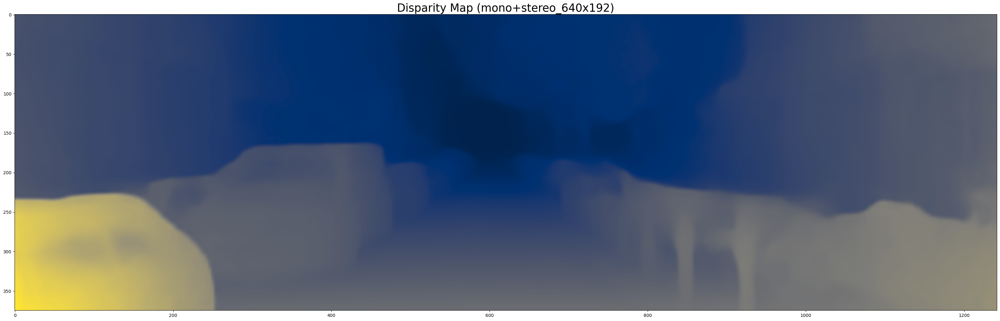

In [14]:
# Load the pretrained model.
model_name = "mono+stereo_640x192"
download_model_if_doesnt_exist(model_name)
encoder_path = os.path.join("models", model_name, "encoder.pth")
depth_decoder_path = os.path.join("models", model_name, "depth.pth")

encoder = ResnetEncoder(18, False)
depth_decoder = DepthDecoder(num_ch_enc=encoder.num_ch_enc, scales=range(4))
loaded_dict_enc = torch.load(encoder_path, map_location='cpu')
filtered_dict_enc = {k: v for k, v in loaded_dict_enc.items() if k in encoder.state_dict()}
encoder.load_state_dict(filtered_dict_enc)
loaded_dict = torch.load(depth_decoder_path, map_location='cpu')
depth_decoder.load_state_dict(loaded_dict)
encoder.eval()
depth_decoder.eval();

# Generate disparity
image_path = left_image_paths[img_index]
resize_height = loaded_dict_enc['height']
resize_width = loaded_dict_enc['width']
image, original_size = load_and_preprocess_image(image_path, resize_width, resize_height)

with torch.no_grad():
    features = encoder(image)
    outputs = depth_decoder(features)

disp = outputs[("disp", 0)]
disp_resized = torch.nn.functional.interpolate(disp, original_size, mode="bilinear", align_corners=False)
disp_resized_np = disp_resized.squeeze().cpu().numpy()
disparity_map_monodepth_2 = disp_resized_np

plt.figure(figsize = (40,40))
plt.imshow(disparity_map_monodepth_2, cmap='cividis')
plt.title('Disparity Map (mono+stereo_640x192)', size=25)
plt.show()


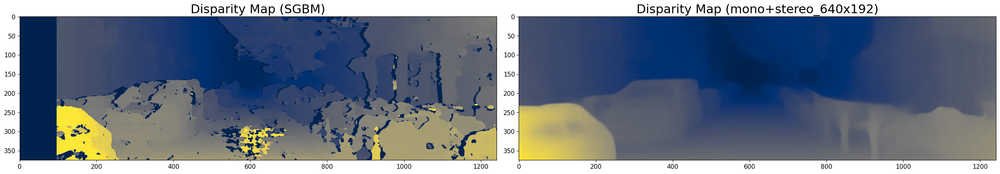

In [44]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10)) 
ax1.imshow(disparity_stereo, cmap='cividis')
ax1.set_title('Disparity Map (SGBM)', size=22)
ax2.imshow(disparity_map_monodepth_2, cmap='cividis')
ax2.set_title('Disparity Map (mono+stereo_640x192)', size=22)
plt.tight_layout()
plt.show()

# Part 2d: Critique both methods (SGBM & Monodepth) and comment on their performance. 

<span style="color:blue">Answer: </span>

The two maps provide there advantages and disadvantes. The Disparity map provides alot more information on edge changes and finer grained inforamtion for example you can see the edges of cars alot clearer in this disparity map however it is alot more susceptible to noise which can be seen with the yellow and blue speckles in the foregorund in the middle of the image.

For the monodepth image it is a much cleaner image and is alot more effective for our use case as ther is very little noise present in teh image. However in order to look for fine grained information in the disparity map the monodepth map is blurred so this inforamtion is not very accurate.

In terms of our use case the monodepth would possibly be the best performing image as we use the yolo model for our fine grained information in terms of identifying features and then we use the stereo depth images and depth maps to claculat the depth. In this case we would like to decrease noise and ensure we can calculate the depth of teh image safely. 


# Part 3: Generate Depth Map.

# Part 3a: Generate Depth Map from SGBM Disparity Map

In [16]:
def calc_depth_map(disparity_left, intrinsic_left, T_left, T_right):
   
    baseline = np.linalg.norm(T_right - T_left)
    
    focal_length = intrinsic_left[0][0]
    
    disparity = disparity_left.copy() 
    print(disparity)
    
    min_disparity = 0.5

    disparity = np.where(disparity <= 0, min_disparity, disparity)
    
    #Calculate depth map using the formula: depth = (baseline * focal_length) / disparity
    depth_map = (baseline * focal_length) / disparity

    return depth_map

In [17]:
# Helper Function
def decompose_projection_matrix(P):    
    K, R, T, _, _, _, _ = cv2.decomposeProjectionMatrix(P)
    T = T/T[3]

    return K, R, T

[[         -1          -1          -1 ...          48          48          48]
 [         -1          -1          -1 ...          48          48          48]
 [         -1          -1          -1 ...      48.125      48.125      48.125]
 ...
 [         -1          -1          -1 ...      75.125      75.125      75.125]
 [         -1          -1          -1 ...      75.062      75.062      75.062]
 [         -1          -1          -1 ...      75.062      75.062          75]]
Average depth: 118.6552


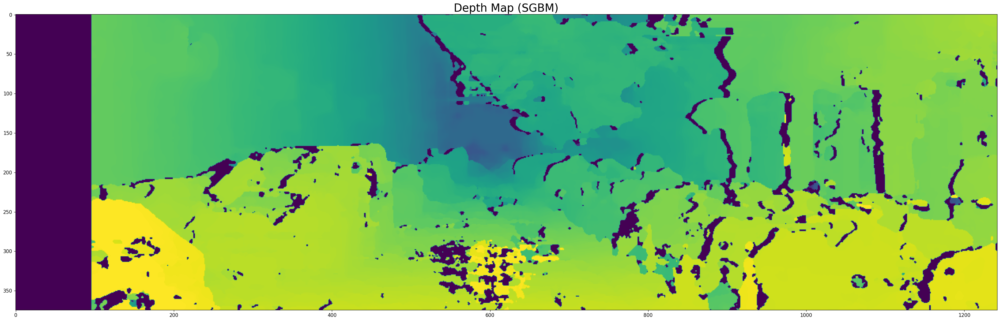

In [45]:
K_left, R_left, T_left = decompose_projection_matrix(P_left)
K_right, R_right, T_right = decompose_projection_matrix(P_right)

depth_map_stereo = calc_depth_map(disparity_stereo, K_left, T_left, T_right)

# Calculate average depth
average_depth = np.mean(depth_map_stereo)

print(f"Average depth: {average_depth:.4f}")

plt.figure(figsize = (40,40))
plt.imshow(np.log(depth_map_stereo), cmap='viridis_r')
plt.title('Depth Map (SGBM)', size=25)
plt.show()

# Part 3b: Generate Depth Map from Monodepth disparity map.

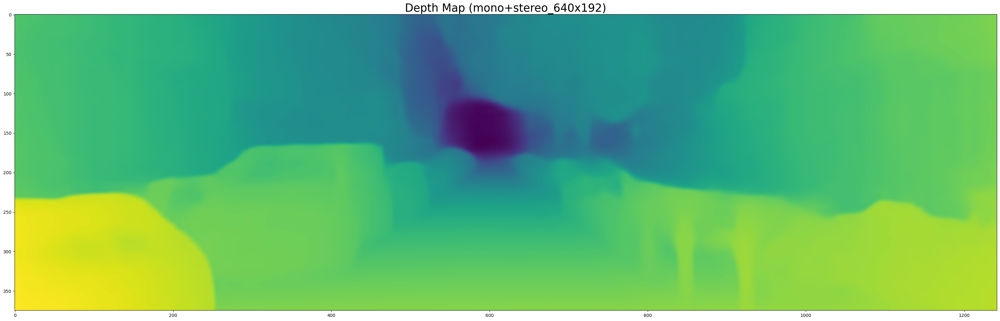

In [19]:
scaled_depth, depth = disp_to_depth(disparity_map_monodepth_2, 0.1, 100)
depth = torch.tensor(depth)
metric_depth = 5.4*depth

plt.figure(figsize = (40,40))
plt.imshow(np.log(metric_depth), cmap='viridis_r')
plt.title('Depth Map (mono+stereo_640x192)', size=25)
plt.show()

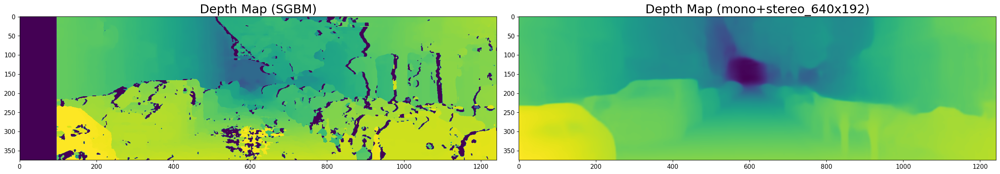

In [46]:
fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(25, 15))
ax1.imshow(np.log(depth_map_stereo), cmap='viridis_r')
ax1.set_title('Depth Map (SGBM)', size=22)
ax2.imshow(np.log(metric_depth), cmap='viridis_r')
ax2.set_title('Depth Map (mono+stereo_640x192)', size=22)
plt.tight_layout()  
plt.show()

# Part 3c: Critique both depth maps (SGBM & Monodepth) and comment on their performance. 

<span style="color:blue">Answer: </span>
The comparison of these two maps is very similar to that of the disparity map above. The depth map using the SGBM algorithm shows much finer details for example the areas of purple in the image describe areas of edges for example you can see the edges of cars however these lead to inaccurate reading s when trying to calculate depth. Also one of the major differneces between teh two images is the left image hgas the large puprple strip in teh left side of the image. 

The right monodepth image does not have this present and its transitio in depth is much more gradual. For our use case this weill lead to a mucg more accurate predictions of depth as it shouldn't be effected by nosie provided that the noise hasn't been blurred around the whole area pf the iamge. When we calculate depth using the left image teh purple pixels cause the depth calculations to skew and therfore create slightly inaccurate readings due to this. 

# Part 4: Generate 2D Detections

Use yolov5 (from ultralytics) to generate 2D Bounding Box detections

Set the confidence and IoU filters to 0.25 

If you use openCV to read in the image you will need to convert from BGR to RGB 

Display the bounding boxes

https://docs.ultralytics.com/yolov5/tutorials/pytorch_hub_model_loading/#simple-example

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-3-7 Python-3.10.12 torch-2.5.1+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:894: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 375x1242 1 person, 5 bicycles, 9 cars, 1 truck
Speed: 6.2ms pre-process, 121.6ms inference, 1.7ms NMS per image at shape (1, 3, 224, 640)


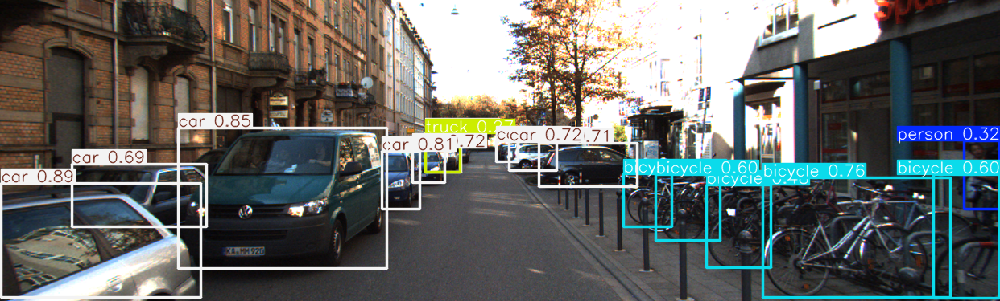

,xmin,ymin,xmax,ymax,confidence,class,name
0,1.314599,228.739090,249.301865,370.901184,0.891021,2,car
1,221.225616,159.454178,480.058228,334.117157,0.852710,2,car
2,474.286285,188.604416,521.694824,260.243011,0.807480,2,car
3,947.005615,221.865616,1180.819458,370.419678,0.764947,1,bicycle
4,632.386841,176.155701,691.475098,212.389389,0.716998,2,car
5,512.608398,184.620728,552.364319,227.953369,0.715361,2,car
6,669.330933,178.582657,791.521484,232.212250,0.714514,2,car
7,89.902870,204.594955,256.719849,282.896545,0.687325,2,car
8,1159.710205,217.140060,1241.490723,371.067474,0.600411,1,bicycle
9,814.246887,217.591354,894.651001,299.002747,0.597352,1,bicycle


In [48]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

model.conf = 0.25  
model.iou = 0.25  

left_img_rgb = cv2.cvtColor(cv2.imread(left_image_paths[img_index]), cv2.COLOR_BGR2RGB)

detections = model([left_img_rgb], size=640)

detections.print()
detections.show()

detections.xyxy[0] 
detections.pandas().xyxy[0]

# Part 5. Get Distance from Depth Map (SGBM & Monodepth) and 2D Detections.

There are a number of ways to get depth from a depth map, given a 2D detection. For example, you can find the min, max, or mean depth of that bounding box. However this has certain flaws. A more robust approach is either getting the depth based on the centre of the bounding box or getting the median depth of the bounding box.

<span style="color:red">Explain why getting the mean/min/max depth within a 2D detection is an inefficient approach.</span>

<span style="color:blue">Answer: </span>
The main issue with calculating the min, max or mean depth is due to the noise that can often be present in the SGBM map. If we calculate the min or max of the boundaing box this could be susceptible to the noise which could be an extremely high or low value this would therefore return an inaccurate depth value. Also, this noise would affect the mean as the noise would affect the average causing inaccurate results. 

__Min/Max depth:__ highly susceptible to noise or outliers in the depth map.
__Mean depth:__ Noisy pixels with extreme depth values can skew the average, leading to an inaccurate representation of the object’s true depth.

The median depth represents the middle value when all depth values within the bounding box are sorted. Since the object of interest typically occupies the majority of the bounding box, the median depth is likely to correspond to the true depth of the object.

Calculating the depth from the center point is a safer calculation as this is where the feature originates from in most Yolo architectures the bounding box is created from the center point. This means that you are guaranteed to be on the object on the object you are getting the depth of where the Yolo algorithm identifies the feature to stem from. If the image is susceptible to noise you might need to put in a check on this calculation as if the center point happens to be in a noisy area this could lead to inaccurate readings. 

# Part 5b: Implement an approach that gets the median and center depth within a 2D detection.

In [54]:
# Complete the function below.
def get_distances(image, depth_map, bboxes, method, draw):
    # This function will use the depth map provided along with the 2D detections to get distance of detected objects.
    # The inputs are the input image (MxNx3), the bounding boxes (bboxes = detections.xyxy[0]), the method (i.e., median or center), and draw (True/False).
    # The outputs are the image with the distances drawn on it and an array of the depth values for each detection.

    # Outputs:
    # 1. Image 
    # 2. depth_arr - an array containing a depth value for each detection based on the method.

    depth_arr = []
    
    for bbox in bboxes:
       
        x1, y1, x2, y2 = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
        #print("Coordinates")
        #print(x1, x2,y1, y2 )
        #Calculate center point
        x_center = (x1 + x2) / 2
        y_center = (y1 + y2) / 2

        #print("Center points")
        #print(x_center, y_center)
        x1_int, y1_int, x2_int, y2_int = int(x1), int(y1), int(x2), int(y2)
        x_center, y_center = int(x_center), int(y_center)
        
        #Ecrop of the bbox
        depth_slice = depth_map[y1:y2, x1:x2]
        
        #compute median and centre depth to get the distance
        if method == 'center':
           
            stereo_depth = depth_map[y_center, x_center]
            #print(stereo_depth)
            depth_arr.append(stereo_depth)
            
        elif method == "median":

            stereo_depth = np.median(depth_slice)
            #print(stereo_depth)
            depth_arr.append(stereo_depth)
    
    depth_arr = np.array(depth_arr)
    
    if draw:
      
        cv2.putText(image,'{0:.2f} m'.format(stereo_depth), (y_center, x_center), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2, cv2.LINE_AA)   

    #average_depth = np.mean(depth_map)
    #median_depth = np.median(depth_map)
    
    #print(f"Average depth: {average_depth:.4f}")
    #print(median_depth)

    return image, depth_arr

# Part 5c: Compare the results from the median and center approach.

In [55]:
img_index = 80
left_image = cv2.cvtColor(cv2.imread(left_image_paths[img_index]), cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(cv2.imread(right_image_paths[img_index]), cv2.COLOR_BGR2RGB)

bboxes = detections.xyxy[0]
_, depth_arr_median = get_distances(left_image, depth_map_stereo, bboxes, method='median', draw=True)
_, depth_arr_center = get_distances(left_image, depth_map_stereo, bboxes, method='center', draw=True)

# Calculate average depth
average_depth = np.mean(depth_map_stereo)

print(f"Average depth: {average_depth:.4f}")

Average depth: 118.6552


In [56]:
print("median approach (m)", depth_arr_median)
print("center appraoch (m)", depth_arr_center)

median approach (m) [     8.2773         8.2      15.433      6.1012      35.345      25.102      21.504      8.3109      6.7657      10.714      7.3653      11.061      64.737      9.5349        37.5        37.5]
center appraoch (m) [      4.111      8.7483      14.927      6.0591      34.746      25.205      21.207      8.3447      6.7213      9.3041      7.2695      11.081      58.019      9.5349      37.048      37.273]


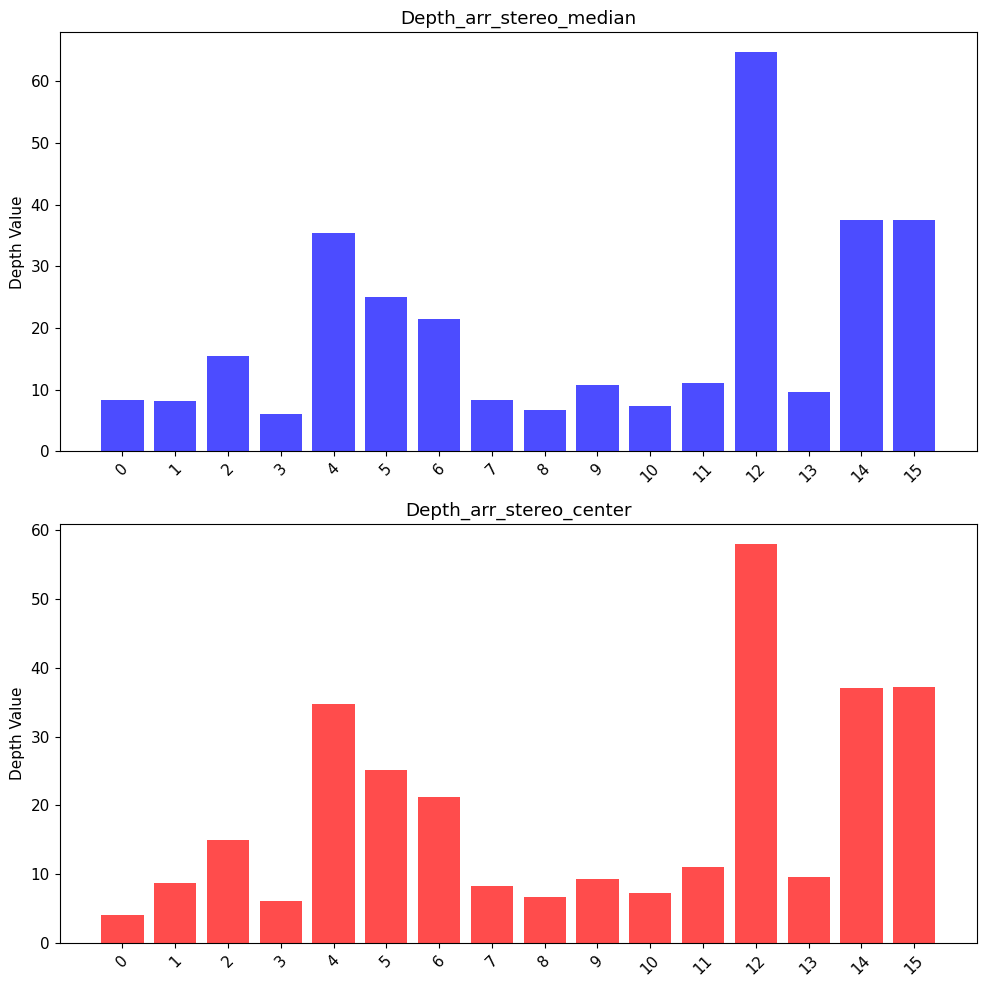

In [57]:
%matplotlib inline
# Create bar plots
x = np.arange(len(depth_arr_median))  # X-axis positions

fig, axs = plt.subplots(2, figsize=(10, 10))
axs[0].bar(x, depth_arr_median, color='b', alpha=0.7)
axs[0].set_title('Depth_arr_stereo_median')

axs[1].bar(x, depth_arr_center, color='r', alpha=0.7)
axs[1].set_title('Depth_arr_stereo_center')

# Set x-axis labels (optional)
for ax in axs:
    ax.set_xticks(x)
    ax.set_xticklabels([str(i) for i in range(len(depth_arr_median))], rotation=45)
    ax.set_ylabel('Depth Value')

# Adjust layout for better visibility
plt.tight_layout()
plt.show()

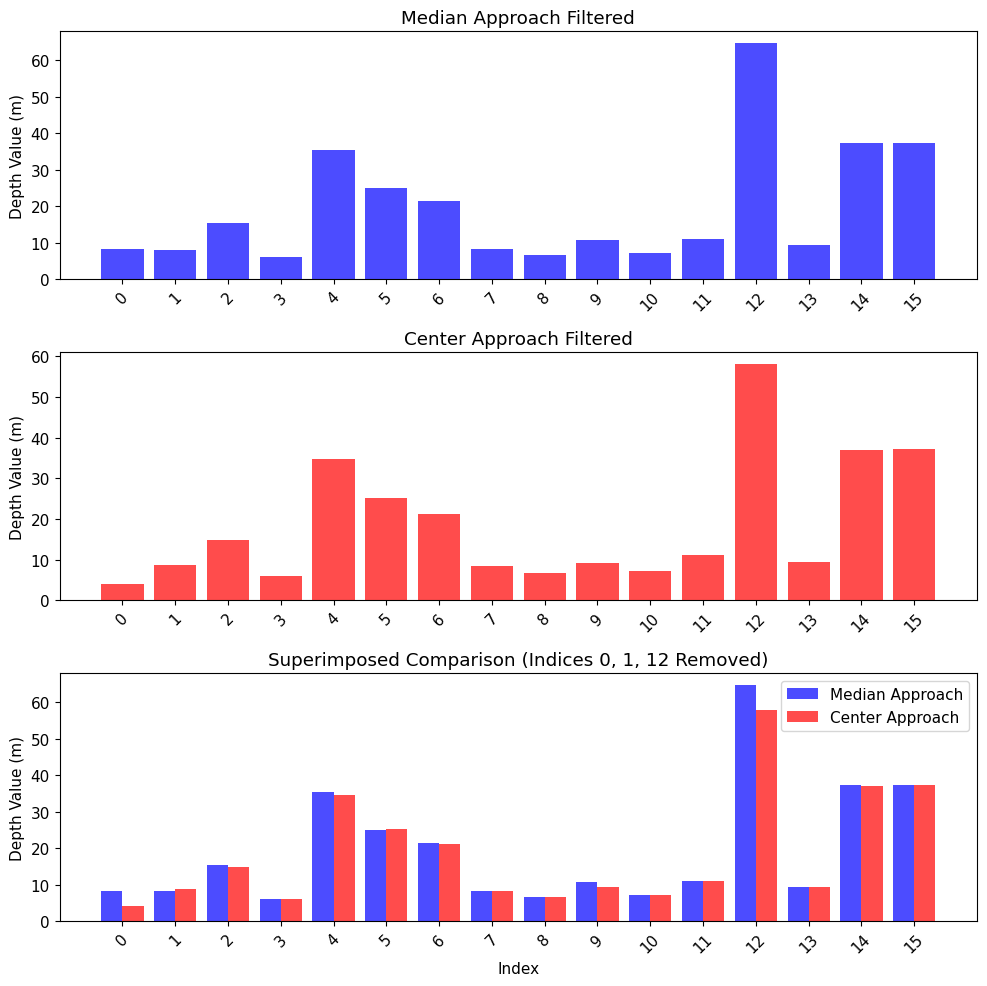

In [59]:
# Indices to remove: 0, 1, 12
# If the center results are obviously wrong remove them 
indices_with_gaps = {}

# Replace values at these indices with np.nan to create gaps
modified_median = [val if i not in indices_with_gaps else np.nan for i, val in enumerate(depth_arr_median)]
modified_center = [val if i not in indices_with_gaps else np.nan for i, val in enumerate(depth_arr_center)]

# X-axis positions
x = np.arange(len(modified_median))

# Create subplots
fig, axs = plt.subplots(3, figsize=(10, 10))

# Plot modified data (with gaps)
axs[0].bar(x, modified_median, color='b', alpha=0.7)
axs[0].set_title('Median Approach Filtered')

axs[1].bar(x, modified_center, color='r', alpha=0.7)
axs[1].set_title('Center Approach Filtered')

width = 0.4
axs[2].bar(x - width/2, modified_median, width=width, color='b', alpha=0.7, label='Median Approach')
axs[2].bar(x + width/2, modified_center, width=width, color='r', alpha=0.7, label='Center Approach')
axs[2].set_title('Superimposed Comparison (Indices 0, 1, 12 Removed)')
axs[2].legend()

# Set x-axis labels
for ax in axs:
    ax.set_xticks(x)
    ax.set_xticklabels([str(i) for i in range(len(modified_median))], rotation=45)
    plt.xlabel('Index')
    ax.set_ylabel('Depth Value (m)')

# Adjust layout
plt.tight_layout()
plt.show()

# Part 5d: Comment on the difference between the two methods (median/center).

<span style="color:blue">Answer: </span>

To compare the median and center depth estimation methods, I placed the two graphs directly beside each other for a direct visual comparison. The main differences between the two methods are evident in items such as Item 0 and Item 12, where the depth estimate using the center method is lower than the estimate using the median method. This occurs because the center method relies on the depth value at the center pixel of the bounding box, which may lie on a closer part of the object. In contrast, the median method considers all depth values within the bounding box and selects the middle value, providing a more representative depth estimate for the entire object.

The center method is simple and computationally efficient but can be affected by noise or inaccuracies in the depth map. If the center pixel falls on a noisy or outlier depth value, the estimate may be skewed. On the other hand, the median method is more robust to noise and outliers, as it reduces the impact of extreme or incorrect depth values.

In terms of object shape and size, the center method works well for symmetric and centered objects, while the median method is better suited for irregularly shaped or off-center objects. Although the median method is slightly more computationally expensive, its improved robustness and accuracy often justify the additional cost.

Image 0 is also the car in the bottom left corner of the frame. When we look at the depth map for this area there is a large strip in the left side of the image which would possibly drive teh median measuremnts up as all of this sttrip describes very high depth causing the median value to be higher. 

# Part 6: Compare Estimated Depth to LiDAR Ground Truth.

In [27]:
# Helper Function
def project_velo2cam(lidar_bin, image):
    ''' Projects LiDAR point cloud onto the image coordinate frame '''

    # get camera (u, v, z) coordinates
    velo_camera = get_velo2cam(lidar_bin)

    (u, v, z) = velo_camera

    # remove outliers (points outside of the image frame)
    img_h, img_w, _ = image.shape
    u_out = np.logical_or(u < 0, u > img_w)
    v_out = np.logical_or(v < 0, v > img_h)
    outlier = np.logical_or(u_out, v_out)
    velo_camera = np.delete(velo_camera, np.where(outlier), axis=1)
    
    return velo_camera

In [28]:
# Helper Function
def get_velo2cam(lidar_bin):
    ''' Converts the LiDAR point cloud to camera (u, v, z) image coordinates, 
        where z is in meters
        '''
    # read in LiDAR data
    scan_data = np.fromfile(lidar_bin, dtype=np.float32).reshape((-1,4))

    # convert to homogeneous coordinate system
    velo_points = scan_data[:, 0:3] # (x, y, z) --> (front, left, up)
    velo_points = np.insert(velo_points, 3, 1, axis=1).T # homogeneous LiDAR points

    # delete negative liDAR points
    velo_points = np.delete(velo_points, np.where(velo_points[3, :] < 0), axis=1) 

    # possibly use RANSAC to remove the ground plane for better viewing?

    # convert to camera coordinates 
    velo_camera = P_left @ R_left_rect @ T_cam_velo @ velo_points


    # delete negative camera points ??
    velo_camera  = np.delete(velo_camera , np.where(velo_camera [2,:] < 0)[0], axis=1) 

    # get camera coordinates u,v,z
    velo_camera[:2] /= velo_camera[2, :]

    return velo_camera

# Part 6a: Get LiDAR Ground Truth given a 2D bounding box.

In [29]:
# Complete the function below.
def get_lidar_gt(bboxes, velo_camera):
    # This function will get the distance from the LiDAR for the 2D Detection.

    gt_depth_lidar_arr = []
    
    # unpack LiDAR camera coordinates
    u, v, z = velo_camera

    for bbox in bboxes:
        # get pt1 (x1, y1) and pt2 (x2, y2) ... same as in def get_distances
        x1, y1, x2, y2 = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
        
        # Calculate center point
        x_center = int((x1 + x2) / 2)
        y_center = int((y1 + y2) / 2)
    
        # now get the closest LiDAR points to the center
        center_delta = np.abs(np.array((v, u))- np.array([[y_center, x_center]]).T)
        
        # choose coordinate pair with the smallest L2 norm
        min_loc = np.argmin(np.linalg.norm(center_delta, axis=0))

        velo_depth = z[min_loc]
        gt_depth_lidar_arr.append(velo_depth)

    return gt_depth_lidar_arr

In [30]:
bboxes = detections.xyxy[0]
lidar_bin = bin_paths[img_index]

R_left_rect = np.array([float(x) for x in cam_calib[24].strip().split(' ')[1:]]).reshape((3, 3,))
R_left_rect = np.insert(R_left_rect, 3, values=[0,0,0], axis=0)
R_left_rect = np.insert(R_left_rect, 3, values=[0,0,0,1], axis=1)

velo_camera = project_velo2cam(lidar_bin, left_image)

gt_depth_lidar_arr = get_lidar_gt(bboxes, velo_camera)

LiDAR Ground Truth [3.598712832396921, 7.232309344406232, 14.831146414574349, 6.79011014002295, 34.51072420640011, 24.459894014999605, 20.616937683365485, 9.823061346979552, 8.478990451845396, 11.274498984425268, 10.082069122158892, 10.817711370343245, 61.162469350205306, 9.19301486683595, 36.090959275250555, 36.090959275250555]


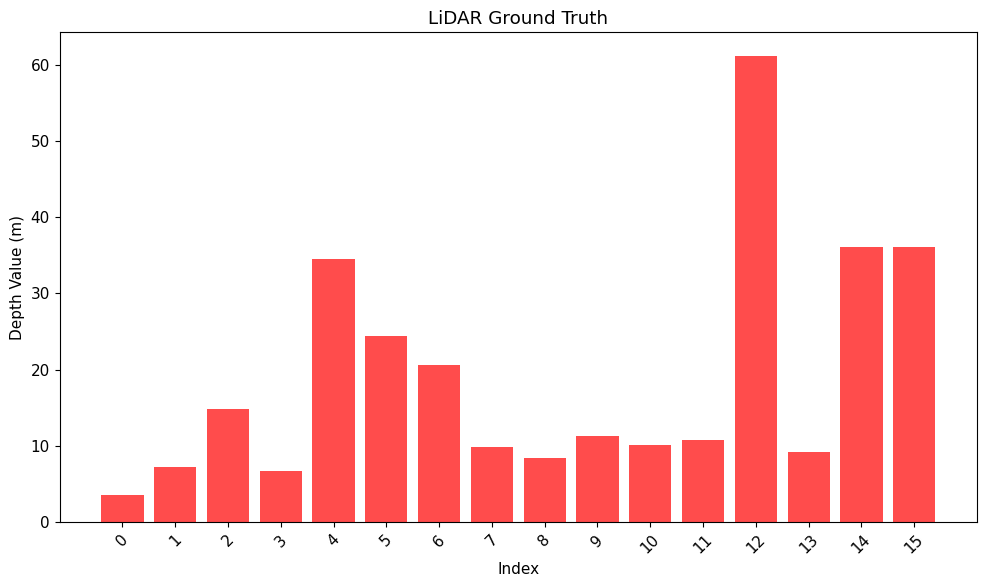

In [31]:
print("LiDAR Ground Truth", gt_depth_lidar_arr)

# Create bar plots
x = np.arange(len(gt_depth_lidar_arr))  # X-axis positions

# Create figure and plot a single bar chart
plt.figure(figsize=(10, 6))
plt.bar(x, gt_depth_lidar_arr, color='r', alpha=0.7)

# Titles and labels
plt.title('LiDAR Ground Truth')
plt.xlabel('Index')
plt.ylabel('Depth Value (m)')

# Set x-axis labels
plt.xticks(x, [str(i) for i in range(len(gt_depth_lidar_arr))], rotation=45)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Part 6b: Compare LiDAR GT to depth maps.

Stereo Depth (SGBM) [     8.2773         8.2      15.433      6.1012      35.345      25.102      21.504      8.3109      6.7657      10.714      7.3653      11.061      64.737      9.5349        37.5        37.5]


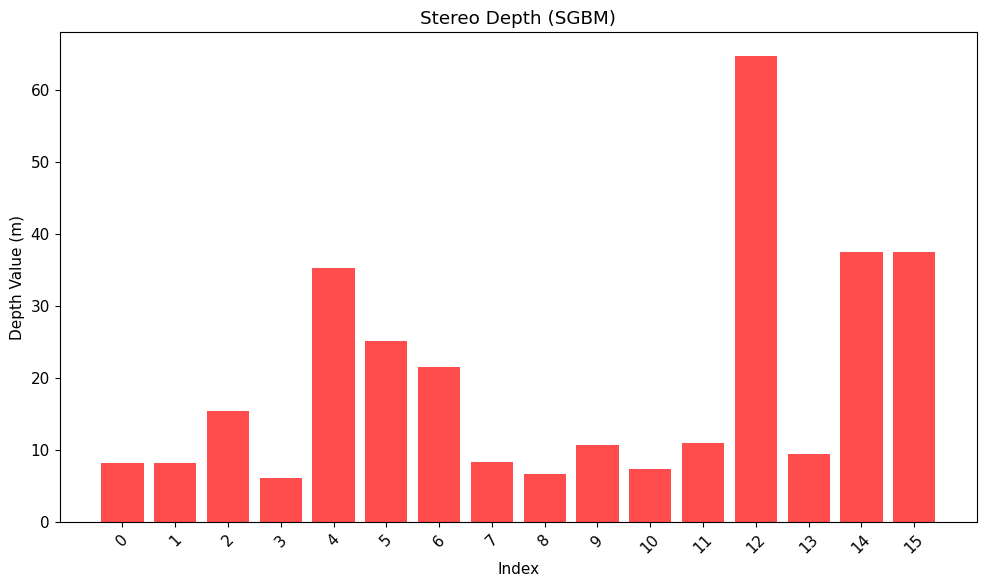

In [60]:
bboxes = detections.xyxy[0]
left_image_stereo, depth_arr_stereo = get_distances(left_image, depth_map_stereo, bboxes, method='median', draw=True)
print("Stereo Depth (SGBM)", depth_arr_stereo)

indices_with_gaps = {}

# Replace values at these indices with np.nan to create gaps
depth_arr_stereo = [val if i not in indices_with_gaps else np.nan for i, val in enumerate(depth_arr_stereo)]

# Create bar plots
x = np.arange(len(depth_arr_stereo))  # X-axis positions

# Create figure and plot a single bar chart
plt.figure(figsize=(10, 6))
plt.bar(x, depth_arr_stereo, color='r', alpha=0.7)

# Titles and labels
plt.title('Stereo Depth (SGBM)')
plt.xlabel('Index')
plt.ylabel('Depth Value (m)')

# Set x-axis labels
plt.xticks(x, [str(i) for i in range(len(gt_depth_lidar_arr))], rotation=45)

# Adjust layout and display
plt.tight_layout()
plt.show()

Monodepth [     3.5602      8.2074      15.077      5.4186      30.314      23.194      17.431      7.0927      4.7045      7.0521       6.279      7.8071      56.197      6.7638      32.022      32.397]


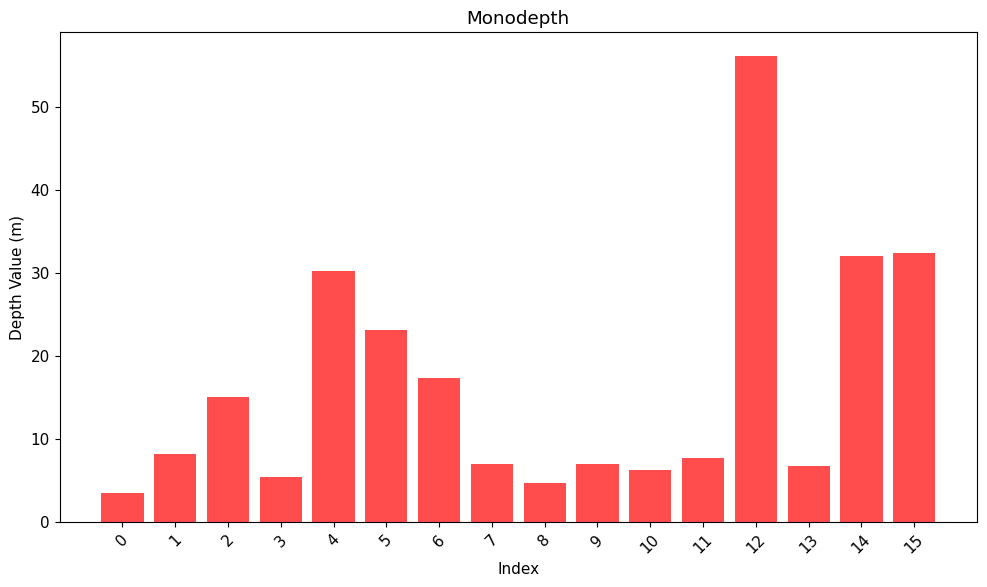

In [61]:
bboxes = detections.xyxy[0]
left_image_monodepth, depth_arr_monodepth = get_distances(left_image, metric_depth, bboxes, method='median', draw=True)
print("Monodepth", depth_arr_monodepth)

# Create bar plots
x = np.arange(len(depth_arr_monodepth))  # X-axis positions

# Create figure and plot a single bar chart
plt.figure(figsize=(10, 6))
plt.bar(x, depth_arr_monodepth, color='r', alpha=0.7)

# Titles and labels
plt.title('Monodepth')
plt.xlabel('Index')
plt.ylabel('Depth Value (m)')

# Set x-axis labels
plt.xticks(x, [str(i) for i in range(len(gt_depth_lidar_arr))], rotation=45)

# Adjust layout and display
plt.tight_layout()
plt.show()

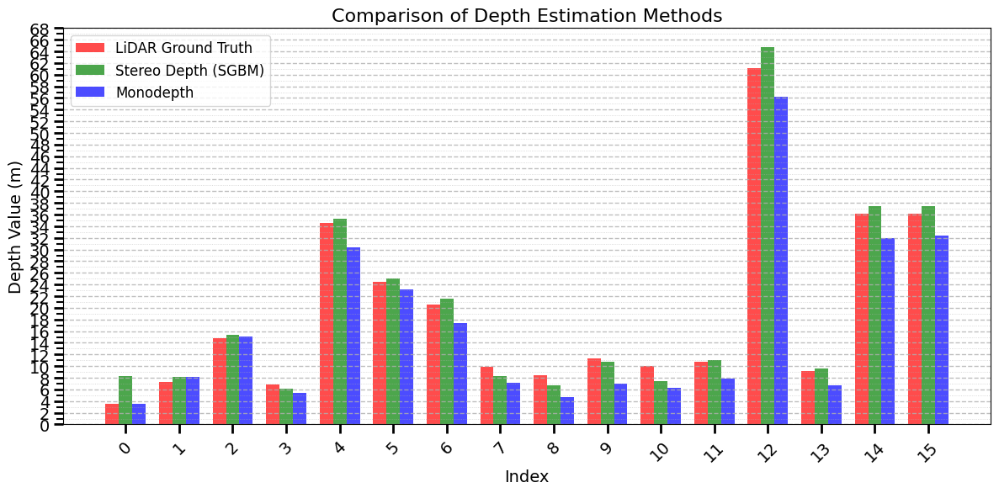

In [62]:
import numpy as np
import matplotlib.pyplot as plt

# Ensure all arrays have the same length (adjust if necessary)
num_values = min(len(gt_depth_lidar_arr), len(depth_arr_stereo), len(depth_arr_monodepth))

# Trim arrays to the same minimum length
gt_depth_lidar_arr = gt_depth_lidar_arr[:num_values]
depth_arr_stereo = depth_arr_stereo[:num_values]
depth_arr_monodepth = depth_arr_monodepth[:num_values]

# X-axis positions
x = np.arange(num_values)  

# Set bar width
bar_width = 0.25  

# Create figure
plt.figure(figsize=(12, 6))

plt.bar(x, gt_depth_lidar_arr, width=bar_width, color='r', alpha=0.7, label='LiDAR Ground Truth')
plt.bar(x + bar_width, depth_arr_stereo, width=bar_width, color='g', alpha=0.7, label='Stereo Depth (SGBM)')
plt.bar(x + 2 * bar_width, depth_arr_monodepth, width=bar_width, color='b', alpha=0.7, label='Monodepth')

# Titles and labels
plt.title('Comparison of Depth Estimation Methods', fontsize=16)
plt.xlabel('Index', fontsize=14)
plt.ylabel('Depth Value (m)', fontsize=14)

# Adjust x-axis labels to be centered with increased fontsize
plt.xticks(x + bar_width, [str(i) for i in range(num_values)], rotation=45, fontsize=12)
plt.yticks(fontsize=12)  # Increase Y-axis tick label size

# Set major Y-axis ticks every 2 meters (with labels)
y_min, y_max = plt.ylim()  
plt.yticks(np.arange(0, y_max + 2, 2))

# Add minor ticks every 1 meter
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(1))

# Increase major tick size and width
plt.tick_params(axis='both', which='major', labelsize=14, length=8, width=2)

# Increase minor tick size and width (no labels for minor ticks)
plt.tick_params(axis='y', which='minor', length=6, width=1.5, labelsize=0)

# Add grid lines for better readability
plt.grid(axis='y', which='major', linestyle='--', linewidth=1, alpha=0.8)  # Major grid lines
plt.grid(axis='y', which='minor', linestyle=':', linewidth=0.6, alpha=0.6)  # Minor grid lines

# Add legend with larger font size
plt.legend(fontsize=12)

# Adjust layout and display
plt.tight_layout()
plt.show()

Add a few comments discussing the relative performance of each depth map. Compare them with the LiDAR ground truth

<span style="color:blue">Answer: </span>

The graph above compares all three of the deoth estimation methods. The main descreptancy's are shown with the SGBM estimatio for object 0 and object 12. However both the monodepth and SGBM algorithms have their fallbacks and we can discuss this using the previously discussed problems with both models. 

Firstly I am surprised how accurate the SGBM depth map is compared to the ground truth depth map considering how noisy the image is. The median approach mitigates teh nosie quite well and although it deviates slighly from the ground truth it is within a comparable value. 

The monodepth implementation has the performance I expected with very little noise present I expected the depth map to predict close to the ground tructh however sense the monodepth impleemntation is quite blurred or lacks features it causes the depth calcualtion to be very close to the correct depth but it will never be highly accurate to the exact same value as the ground truth. 

In conclusion all impleemntations perform to a good standard with the SGBM being good for finding fine grained features and looking for inofrmation in the image however in terms of calculating depth with less susceptibility for nosie the monotone depth estiamtion is a better implemntation. 
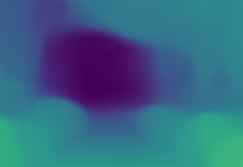
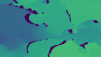